In [ ]:
import keras
from keras import layers
from keras.layers import Conv2D, Conv3D, Flatten, Dense, Reshape, BatchNormalization, LSTM, Concatenate, TimeDistributed
from keras.layers.convolutional import AveragePooling3D
from keras.layers.advanced_activations import PReLU
from keras.layers import Dropout, Input
from keras.models import Model, model_from_json
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau
from keras.utils import np_utils
from keras.utils.layer_utils import count_params
import tensorflow as tf

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, cohen_kappa_score, f1_score

from operator import truediv

from plotly.offline import init_notebook_mode

import numpy as np
from numpy import clip
import pandas as pd
import matplotlib.pyplot as plt
import scipy.io as sio
import imblearn
from imblearn.over_sampling import SMOTE, ADASYN, SVMSMOTE, BorderlineSMOTE
import os
import math

!pip install spectral
import spectral

import zipfile


!pip install keras-tuner
import kerastuner as kt
from kerastuner.engine.hyperparameters import HyperParameters

init_notebook_mode(connected=True)
%matplotlib inline

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.



     |████████████████████████████████| 184kB 8.1MB/s 
  Created wheel for spectral: filename=spectral-0.22.2-cp37-none-any.whl size=212938 sha256=fbe8f9e93bc796198b8987981ff14d3bc926dbe204afb5feaee2e83c367e873b
  Stored in directory: /root/.cache/pip/wheels/fb/00/da/ac778d1ab6e196cb7f56d104d4dfdfc0aad4e2b208275c0726
Successfully built spectral
     |████████████████████████████████| 71kB 5.6MB/s 
  Created wheel for keras-tuner: filename=keras_tuner-1.0.2-cp37-none-any.whl size=78938 sha256=d455aa9d94e59273a01c6fc812162d452556e4ab0c856b90b84695ad729d2da9
  Stored in directory: /root/.cache/pip/wheels/bb/a1/8a/7c3de0efb3707a1701b36ebbfdbc4e67aedf6d4943a1f463d6
  Created wheel for terminaltables: filename=terminaltables-3.1.0-cp37-none-any.whl size=15356 sha256=31d97c46bd4c90cacc9c80ada6b76391a39f5c429eab40a5b6138a5f65b528dd
  Stored in directory: /root/.cache/pip/wheels/30/6b/50/6c75775b681fb36cdfac7f19799888ef9d8813aff9e379663e
Successfully built keras-tuner terminaltables


# Data Loading

In [ ]:
def unzipping(path, folderNameToSave):
  zip_ref = zipfile.ZipFile(path, 'r')
  zip_ref.extractall(folderNameToSave)
  zip_ref.close()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
unzipping('/content/drive/MyDrive/data.zip', 'data')

In [ ]:
def loadData(name):
    data_path = os.path.join(os.getcwd(),'data/data')
    if name == 'IP':
        data = sio.loadmat(os.path.join(data_path, 'Indian_pines_corrected.mat'))['indian_pines_corrected']
        labels = sio.loadmat(os.path.join(data_path, 'Indian_pines_gt.mat'))['indian_pines_gt']
    elif name == 'SA':
        data = sio.loadmat(os.path.join(data_path, 'Salinas_corrected.mat'))['salinas_corrected']
        labels = sio.loadmat(os.path.join(data_path, 'Salinas_gt.mat'))['salinas_gt']
    elif name == 'PU':
        data = sio.loadmat(os.path.join(data_path, 'PaviaU.mat'))['paviaU']
        labels = sio.loadmat(os.path.join(data_path, 'PaviaU_gt.mat'))['paviaU_gt']
    elif name == 'UH':
        data = sio.loadmat(os.path.join(data_path, 'houston.mat'))['houston']
        labels = sio.loadmat(os.path.join(data_path, 'houston_gt.mat'))['houston_gt_tr']
        labels += sio.loadmat(os.path.join(data_path, 'houston_gt.mat'))['houston_gt_te']
    
    return data, labels

In [ ]:
def splitTrainTestSet(X, y, testRatio, randomState=786):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=testRatio, random_state=randomState,
                                                        stratify=y)
    return X_train, X_test, y_train, y_test

In [ ]:
def applyPCA(X, numComponents=75):
    newX = np.reshape(X, (-1, X.shape[2]))
    pca = PCA(n_components=numComponents, whiten=True)
    newX = pca.fit_transform(newX)
    newX = np.reshape(newX, (X.shape[0],X.shape[1], numComponents))
    return newX, pca

In [ ]:
def padWithZeros(X, margin=2):
    newX = np.zeros((X.shape[0] + 2 * margin, X.shape[1] + 2* margin, X.shape[2]))
    x_offset = margin
    y_offset = margin
    newX[x_offset:X.shape[0] + x_offset, y_offset:X.shape[1] + y_offset, :] = X
    return newX

In [ ]:
def createImageCubes(X, y, windowSize=5, removeZeroLabels = True):
    margin = int((windowSize - 1) / 2)
    zeroPaddedX = padWithZeros(X, margin=margin)
    # split patches
    patchesData = np.zeros((X.shape[0] * X.shape[1], windowSize, windowSize, X.shape[2]))
    patchesLabels = np.zeros((X.shape[0] * X.shape[1]))
    patchIndex = 0
    for r in range(margin, zeroPaddedX.shape[0] - margin):
        for c in range(margin, zeroPaddedX.shape[1] - margin):
            patch = zeroPaddedX[r - margin:r + margin + 1, c - margin:c + margin + 1]   
            patchesData[patchIndex, :, :, :] = patch
            patchesLabels[patchIndex] = y[r-margin, c-margin]
            patchIndex = patchIndex + 1
    if removeZeroLabels:
        patchesData = patchesData[patchesLabels>0,:,:,:]
        patchesLabels = patchesLabels[patchesLabels>0]
        patchesLabels -= 1
    return patchesData, patchesLabels

In [ ]:
def augment_data(dataset, dataset_labels):

  augmented_image = []
  augmented_image_labels = []
  for num in range (0, dataset.shape[0]):
   
   # original image
   img = dataset[num]
   augmented_image.append(img)
   augmented_image_labels.append(dataset_labels[num])
   augmented_image.append(tf.image.flip_left_right(img))
   augmented_image_labels.append(dataset_labels[num])

   augmented_image.append(tf.image.flip_up_down(img))
   augmented_image_labels.append(dataset_labels[num])


   augmented_image.append(tf.image.rot90(img, k=1))
   augmented_image_labels.append(dataset_labels[num])

   augmented_image.append(tf.image.rot90(img, k=2))
   augmented_image_labels.append(dataset_labels[num])

   augmented_image.append(tf.image.rot90(img, k=3))
   augmented_image_labels.append(dataset_labels[num])
  return np.array(augmented_image), np.array(augmented_image_labels)

# Model and Training

In [ ]:
## GLOBAL VARIABLES
dataset = 'SA'
val_ratio = 0.05

if dataset == 'UH':
  windowSize = 5
  K = 15
  test_ratio = 0.98
elif dataset == 'PU':
  windowSize = 17
  K = 15
  test_ratio = 0.98
elif dataset == 'SA':
  windowSize = 17
  K = 15
  test_ratio = 0.98
elif dataset == 'IP':
  windowSize = 17
  K = 15
  test_ratio = 0.90

-0.030429147 0.94248307


7.0     1350
14.0     870
8.0      744
5.0      474
1.0      444
6.0      432
9.0      396
4.0      324
2.0      240
0.0      240
11.0     234
15.0     216
3.0      168
13.0     126
10.0     126
12.0     108
dtype: int64

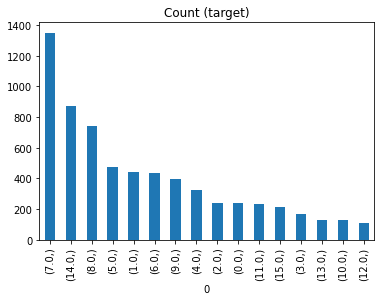

In [ ]:
# Data Loading and Preprocessing

X, y = loadData(dataset)

X = (X - X.mean())/X.std()

X = clip(X, -1.0, 1.0)

X = (X + 1.0) / 2.0

X,pca = applyPCA(X,numComponents=K)


X, y = createImageCubes(X, y, windowSize=windowSize)

Xstrain, Xtest, ystrain, ytest = splitTrainTestSet(X, y, test_ratio)

Xtest = np.array(tf.image.resize(Xtest, [7, 7]))

Xtest_2, Xval, ytest_2, yval = splitTrainTestSet(Xtest, ytest, val_ratio)


Xtrain, ytrain = Xstrain, ystrain

Xtrain = np.array(tf.image.resize(Xtrain, [7, 7]))

windowSize = 7

Xtrain, ytrain = augment_data(Xtrain, ytrain)

print(Xtrain.mean(), Xtrain.std())

yy=pd.DataFrame(ytrain)
yy.value_counts().plot(kind='bar', title='Count (target)');
yy.value_counts()

In [ ]:
Xtrain = Xtrain.reshape(-1, windowSize, windowSize, K, 1)
Xtrain.shape

(6492, 7, 7, 15, 1)

In [ ]:
ytrain = np_utils.to_categorical(ytrain)
ytrain.shape

(6492, 16)

In [ ]:
Xval = Xval.reshape(-1, windowSize, windowSize, K, 1)
Xval.shape

In [ ]:
yval = np_utils.to_categorical(yval)
yval.shape

In [ ]:
Xtest = Xtest.reshape(-1, windowSize, windowSize, K, 1)
Xtest.shape

(53047, 7, 7, 15, 1)

In [ ]:
ytest = np_utils.to_categorical(ytest)
ytest.shape

(53047, 16)

In [ ]:
S = windowSize
L = K

if dataset == 'PU':
  output_units = 9
elif dataset == 'UH':
  output_units = 15
else:
  output_units = 16

In [ ]:
def Conv3DBlock(kernel_list, filter_list, act_list, input_layer, names):
  if(len(kernel_list) != len(filter_list)):
    raise Exception("mismatch in filter list and kernel list")
  else:

    num_blocks = len(filter_list)

    for i in range(num_blocks):
      layer_name = names[1:]+"layer_" + str(i)
      if(i == 0):

        conv_layer = Conv3D(filters = filter_list[i],
                     kernel_size=kernel_list[i], 
                     padding='same', 
                     name = layer_name)(input_layer)
        conv_layer = BatchNormalization(axis=4)(conv_layer)
        conv_layer = Activation("swish")(conv_layer)
      else:
        conv_layer = Conv3D(filters = filter_list[i],
                     kernel_size=kernel_list[i], 
                     padding='same', 
                     name = layer_name)(conv_layer)
        conv_layer = BatchNormalization(axis=4)(conv_layer)
        conv_layer = Activation("swish")(conv_layer)
    return conv_layer

In [ ]:
from keras import backend as Kk

def concat(max_channels, layer):
  channel_num = layer.shape[-1]
  if(max_channels == channel_num):
    return layer
  else:
    channels_required = max_channels - channel_num
    zeros = Kk.zeros_like(layer[:,:,:,:,0])
    zeros = Kk.stack([zeros]*channels_required, axis=-1)
    out_layer = Concatenate(axis=-1)([layer, zeros])
    return out_layer

In [ ]:
def mish_activation(x):
    return (x * Kk.tanh(Kk.softplus(x)))

In [ ]:
def swish_activation(x):
    return (x * Kk.sigmoid(x))

In [ ]:
def bn_mish(input):
    norm = BatchNormalization(axis=4)(input)
    return Activation("mish")(norm)

In [ ]:
from keras.utils.generic_utils import get_custom_objects
from keras.layers import Activation

get_custom_objects().update({'swish': swish_activation})

get_custom_objects().update({'mish': mish_activation})

In [ ]:
class ForgetGate(layers.Layer):
    def __init__(self, initializer="glorot_normal", **kwargs):
        super(ForgetGate, self).__init__(**kwargs)
        self.initializer = keras.initializers.get(initializer)

    def build(self, input_shape):
        self.dim_1 = input_shape[1]
        self.dim_2 = input_shape[2]
        self.dim_3 = input_shape[3]
        self.dim_4 = input_shape[4]
        self.alpha = self.add_weight(
            shape=(self.dim_4, self.dim_4),
            initializer=self.initializer,
            name="alpha",
            regularizer=keras.regularizers.l2(0.0),
            trainable=True,
        )

    def call(self, inputs):
        x = Reshape((self.dim_1*self.dim_2*self.dim_3, self.dim_4))(inputs)
        x_dash =  Kk.sigmoid(Kk.dot(x, self.alpha))
        y = Kk.round(x_dash)
        z = Kk.softmax(x)
        x = x * y
        x = x * x_dash * z
        x = Reshape((self.dim_1, self.dim_2, self.dim_3, self.dim_4))(x)
        return x

    def get_config(self):
        return super(ForgetGate,self).get_config()

In [ ]:
def addLayer(layers_list):
  max_channels = 0
  lists = len(layers_list)

  for i in range(lists):
    max_channels = max(max_channels, layers_list[i].shape[-1])
  
  for i in range(lists):
    layers_list[i] = concat(max_channels, layers_list[i])

  return keras.layers.add(layers_list) 


In [ ]:
def build_model(hp):    
  input_l = Input((S, S, L, 1))

  block_num_ = hp.Int("Blocks_used", 2, 4, step=1, default=4)
  # block_num_ = 3

  prev_layer_list = []

  for bloc in range(block_num_):

    block_no = "_block_" + str(bloc) + "_"

    branches = hp.Int(block_no + "branches", 8, 32, step=8)

    max_layers = math.ceil(math.log2(branches))
    if(max_layers == 0):
      max_layers = 1

    branches_layers_list = []


    for branch in range(branches):
      branch_no = "branch_" + str(branch) + "_"

      num_layers = hp.Int(block_no + branch_no + "layers", 1, max_layers, step=1)

      filter_list_1 = []

      kernel_list_1 = []

      act_list_1 = []
      
      names = block_no+branch_no
      
      for i in range(num_layers):
        filt_nam = "filters" + block_no + branch_no + "layer_" + str(i)
        act_nam = "activation" + block_no + branch_no + "layer_" + str(i)
        ker_nam = "kernel" + block_no + branch_no + "layer_" + str(i)

        filter_list_1.append(hp.Int(filt_nam, 8, 32, step=2, default=16))
        act_list_1.append("swish")
        kernel_list_1.append(
            (hp.Int(ker_nam + "_1", 1, 5, step=2), hp.Int(ker_nam + "_2", 1, 5, step=2), hp.Int(ker_nam + "_3", 1, 7, step=2))
        )

      if (bloc == 0):
        branches_layers_list.append(Conv3DBlock(kernel_list_1, filter_list_1, act_list_1, input_l, names))
      else:
        branches_layers_list.append(Conv3DBlock(kernel_list_1, filter_list_1, act_list_1, prev_layer_list[bloc - 1], names))



    if (len(prev_layer_list) != 0):
      
      for prev_layer in prev_layer_list:
        mul11 = ForgetGate()(prev_layer)
        branches_layers_list.append(mul11)


    add_layer_1 = addLayer(branches_layers_list)

    out_layer = bn_mish(add_layer_1)

    prev_layer_list.append(out_layer)

  # prev_layer_list[-1].shape[1]
  pool1 = AveragePooling3D(pool_size=(prev_layer_list[-1].shape[1], prev_layer_list[-1].shape[2], 1), strides=(1, 1, 1))(prev_layer_list[-1])

  reshape = Reshape((pool1.shape[1], pool1.shape[2]*pool1.shape[3]*pool1.shape[4]), )(pool1)

  lstm_layer_list = []
  # l_lis = [8, 32, 24, 24]
  for lstm_l in range(5):

    lstm_name = "lstm_layer_1_" + str(lstm_l)

    lstm_layer_list.append(LSTM(hp.Int(lstm_name, 8, 32, step=4, default=8), return_sequences=True)(reshape))
  

  lstm_layer = Concatenate(axis=-1)(lstm_layer_list)

  flatten1 = Flatten()(lstm_layer)


  output_layer = Dense(units=output_units, activation="softmax", kernel_initializer="glorot_normal")(flatten1) # (add_layer_4)

  # define the model with input layer and output layer
  model = Model(inputs=input_l, outputs=output_layer)
  adam = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=1e-5) # 1e-04)
  
  trainable_count = count_params(model.trainable_weights)
  non_trainable_count = count_params(model.non_trainable_weights)

  print('Total params: {:,}'.format(trainable_count + non_trainable_count))
  print('Trainable params: {:,}'.format(trainable_count))
  print('Non-trainable params: {:,}'.format(non_trainable_count))
  
  model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'],)
  return model

In [ ]:
hp = HyperParameters()

In [ ]:
class MyTuner(kt.BayesianOptimization):
  def run_trial(self, trial, *args, **kwargs):
    kwargs['batch_size'] = 100
    super(MyTuner, self).run_trial(trial, *args, **kwargs)

In [ ]:
tuner = MyTuner(
    build_model, 
    objective="val_accuracy", 
    max_trials=7,
    seed = 42,
    overwrite=True
)

Total params: 51,120
Trainable params: 49,968
Non-trainable params: 1,152


In [ ]:
# This is a sample of a scheduler I used 
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, min_lr=0.0000001, verbose = 1)

In [ ]:
# checkpoint
filepath = "best_model.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
# early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
callbacks_list = [checkpoint, reduce_lr] # schedule]#, early_stopping]

In [ ]:
tuner.search(
    Xtrain, 
    ytrain,
    validation_data=(Xval, yval),
    epochs = 21,
    callbacks=callbacks_list,
)

Trial 7 Complete [00h 13m 41s]
val_accuracy: 0.9981153607368469

Best val_accuracy So Far: 0.9992461204528809
Total elapsed time: 01h 23m 10s
INFO:tensorflow:Oracle triggered exit


In [ ]:
from contextlib import redirect_stdout

file_name = "summary.txt"

with open(file_name, 'w') as x_file:
  with redirect_stdout(x_file):
    tuner.results_summary()
    print("\n")
    best_model = tuner.get_best_models(1)[0]
    best_hps = tuner.get_best_hyperparameters(1)[0]

In [ ]:
# print(tuner.results_summary())

In [ ]:
best_model = tuner.get_best_models(1)[0]
best_hps = tuner.get_best_hyperparameters(1)[0]

In [ ]:
# serialize model to JSON
model_json = best_model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
best_model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [ ]:
# custom_objects = {"swish_activation": swish_activation, "mish_activation": mish_activation, "ForgetGate": ForgetGate}


# json_file = open('model.json', 'r')
# loaded_model_json = json_file.read()
# json_file.close()
# best_model = model_from_json(loaded_model_json, custom_objects = custom_objects)
# # load weights into new model
# # best_model.load_weights("model.h5")
# print("Loaded model from disk")

# adam = Adam(learning_rate=1.5e-02, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=1e-05) # 1e-04)
# best_model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'],)

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(best_model, to_file='Generic_gated_model.jpg', show_shapes=True, show_layer_names=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.835936 to fit



In [ ]:
best_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 7, 7, 15, 1) 0                                            
__________________________________________________________________________________________________
block_0_branch_6_layer_0 (Conv3 (None, 7, 7, 15, 14) 644         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_11 (BatchNo (None, 7, 7, 15, 14) 56          block_0_branch_6_layer_0[0][0]   
__________________________________________________________________________________________________
activation_11 (Activation)      (None, 7, 7, 15, 14) 0           batch_normalization_11[0][0]     
______________________________________________________________________________________________

In [ ]:
for i in range(len(best_model.layers)):
  print(i, best_model.layers[i])

In [ ]:
extract = Model(best_model.inputs, best_model.layers[742].output)
features = extract.predict(Xval)
print(features)

# Validation

In [ ]:
# # load best weights
# best_model.load_weights("best_model.h5")
# best_model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=1.5e-02, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=1e-05), metrics=['accuracy'])

In [ ]:
def AA_andEachClassAccuracy(confusion_matrix):
    counter = confusion_matrix.shape[0]
    list_diag = np.diag(confusion_matrix)
    list_raw_sum = np.sum(confusion_matrix, axis=1)
    each_acc = np.nan_to_num(truediv(list_diag, list_raw_sum))
    average_acc = np.mean(each_acc)
    return each_acc, average_acc

In [ ]:
def reports (X_test,y_test,name):
    Y_pred = best_model.predict(X_test, batch_size = 100)
    y_pred = np.argmax(Y_pred, axis=1)

    if name == 'IP':
        target_names = ['Alfalfa', 'Corn-notill', 'Corn-mintill', 'Corn'
                        ,'Grass-pasture', 'Grass-trees', 'Grass-pasture-mowed', 
                        'Hay-windrowed', 'Oats', 'Soybean-notill', 'Soybean-mintill',
                        'Soybean-clean', 'Wheat', 'Woods', 'Buildings-Grass-Trees-Drives',
                        'Stone-Steel-Towers']
    elif name == 'SA':
        target_names = ['Brocoli_green_weeds_1','Brocoli_green_weeds_2','Fallow','Fallow_rough_plow','Fallow_smooth',
                        'Stubble','Celery','Grapes_untrained','Soil_vinyard_develop','Corn_senesced_green_weeds',
                        'Lettuce_romaine_4wk','Lettuce_romaine_5wk','Lettuce_romaine_6wk','Lettuce_romaine_7wk',
                        'Vinyard_untrained','Vinyard_vertical_trellis']
    elif name == 'PU':
        target_names = ['Asphalt','Meadows','Gravel','Trees', 'Painted metal sheets','Bare Soil','Bitumen',
                        'Self-Blocking Bricks','Shadows']
    elif name == 'UH':
        target_names = ['Grass-healthy', 'Grass-stressed', 'Grass-synthetic', 'Tree',
                        'Soil', 'Water', 'Residential', 'Commercial', 'Road', 'Highway',
                        'Railway', 'Parking-lot1', 'Parking-lot2', 'Tennis-court', 'Running-track']
    
    classification = classification_report(np.argmax(y_test, axis=1), y_pred, target_names=target_names)
    oa = accuracy_score(np.argmax(y_test, axis=1), y_pred)
    confusion = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
    each_acc, aa = AA_andEachClassAccuracy(confusion)
    kappa = cohen_kappa_score(np.argmax(y_test, axis=1), y_pred)
    score = best_model.evaluate(X_test, y_test, batch_size = 100)

    Test_Loss =  score[0]*100
    Test_accuracy = score[1]*100
    
    return classification, confusion, Test_Loss, Test_accuracy, oa*100, each_acc*100, aa*100, kappa*100

In [ ]:
import time

tik = time.time()
classification, confusion, Test_loss, Test_accuracy, oa, each_acc, aa, kappa = reports(Xtest,ytest,dataset)
print(time.time() - tik)
classification = str(classification)
confusion = str(confusion)
file_name = "classification_report.txt"

with open(file_name, 'w') as x_file:
    x_file.write('{} Test loss (%)'.format(Test_loss))
    x_file.write('\n')
    x_file.write('{} Test accuracy (%)'.format(Test_accuracy))
    x_file.write('\n')
    x_file.write('\n')
    x_file.write('{} Overall accuracy (%)'.format(oa))
    x_file.write('\n')
    x_file.write('{} Average accuracy (%)'.format(aa))
    x_file.write('\n')
    x_file.write('{} Kappa accuracy (%)'.format(kappa))
    x_file.write('\n')
    x_file.write('\n')
    x_file.write('{}'.format(classification))
    x_file.write('\n')
    x_file.write('{}'.format(confusion))

531/531 [==============================] - 107s 184ms/step - loss: 0.0109 - accuracy: 0.9966
204.6029679775238


In [ ]:
def Patch(data,height_index,width_index):
    height_slice = slice(height_index, height_index+PATCH_SIZE)
    width_slice = slice(width_index, width_index+PATCH_SIZE)
    patch = data[height_slice, width_slice, :]
    
    return patch

In [ ]:
# load the original image
X, y = loadData(dataset)

In [ ]:
X = (X - X.mean())/X.std()

X = clip(X, -1.0, 1.0)

X = (X + 1.0) / 2.0

In [ ]:
windowSize = 17
height = y.shape[0]
width = y.shape[1]
PATCH_SIZE = windowSize
numComponents = K

In [ ]:
X,pca = applyPCA(X, numComponents=numComponents)

In [ ]:
X = padWithZeros(X, PATCH_SIZE//2)

In [ ]:
import time

tik = time.time()

# calculate the predicted image

outputs = np.zeros((height,width))
for i in range(height):
    for j in range(width):
        target = int(y[i,j])
        if target == 0 :
            continue
        else :
            image_patch=Patch(X,i,j)
            image_patch = np.array(tf.image.resize(image_patch, [7, 7]))
            X_test_image = image_patch.reshape(1,image_patch.shape[0],image_patch.shape[1], image_patch.shape[2], 1).astype('float32')                                  
            prediction = (best_model.predict(X_test_image, batch_size = 100))
            prediction = np.argmax(prediction, axis=1)
            outputs[i][j] = prediction+1
    print((i+1)*(j+1))

print(time.time() - tik)

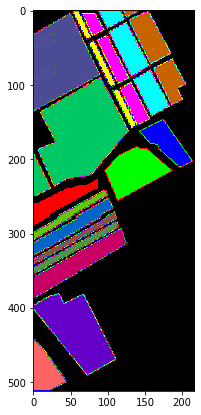

In [ ]:
ground_truth = spectral.imshow(classes = y,figsize =(7,7))

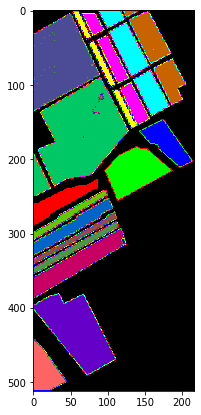

In [ ]:
predict_image = spectral.imshow(classes = outputs.astype(int),figsize =(7,7))

In [ ]:
spectral.save_rgb("ground_truth.jpg", y, colors=spectral.spy_colors)

In [ ]:
spectral.save_rgb("predictions.jpg", outputs.astype(int), colors=spectral.spy_colors)